In [1]:
import numpy as np
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [2]:
# モデル読み込み
pt_model_path = "dense.pt"
dense_model = models.resnet18()
dense_model.fc = nn.Linear(dense_model.fc.in_features, 10)  # CIFAR-10 にあわせて出力層変更
dense_model.load_state_dict(torch.load(pt_model_path))

pt_model_path = "sparse_trained_95.pt"
kyodo_pruning_model = models.resnet18()
kyodo_pruning_model.fc = nn.Linear(kyodo_pruning_model.fc.in_features, 10)  # CIFAR-10 にあわせて出力層変更
kyodo_pruning_model.load_state_dict(torch.load(pt_model_path))

pt_model_path = "ADMM_blocksparse_trained.pt"
model = models.resnet18()
model.fc = nn.Linear(model.fc.in_features, 10)  # CIFAR-10 にあわせて出力層変更
model.load_state_dict(torch.load(pt_model_path))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


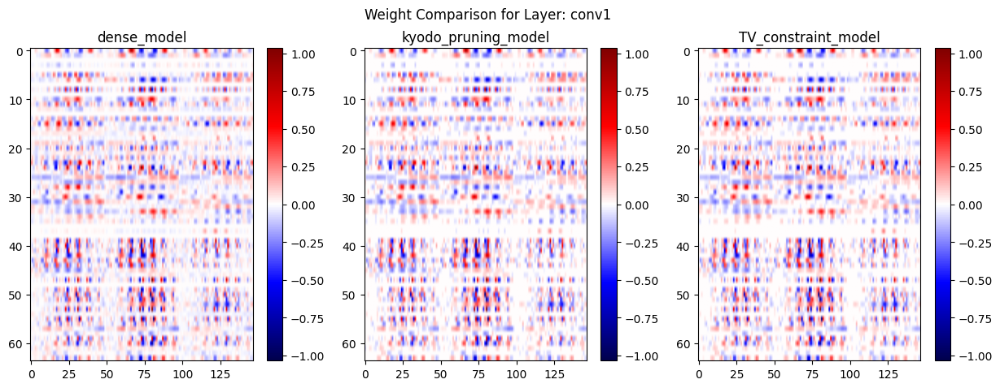

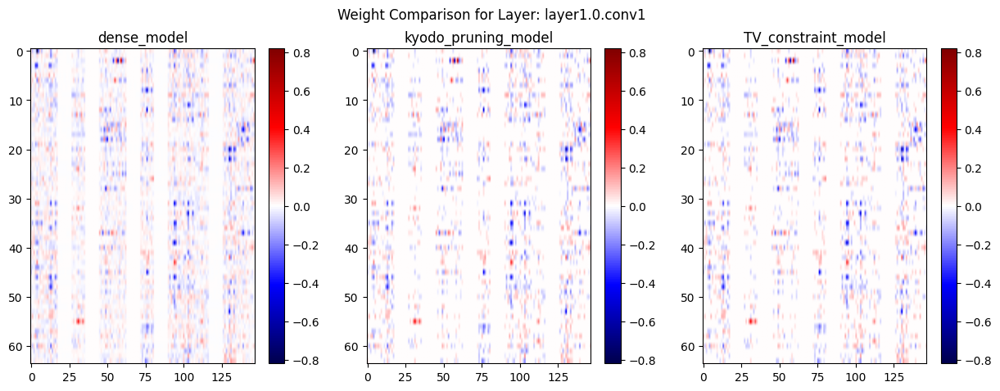

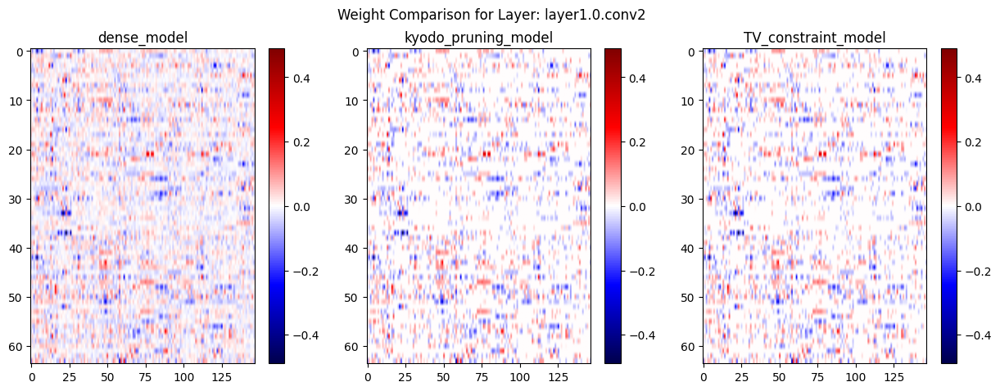

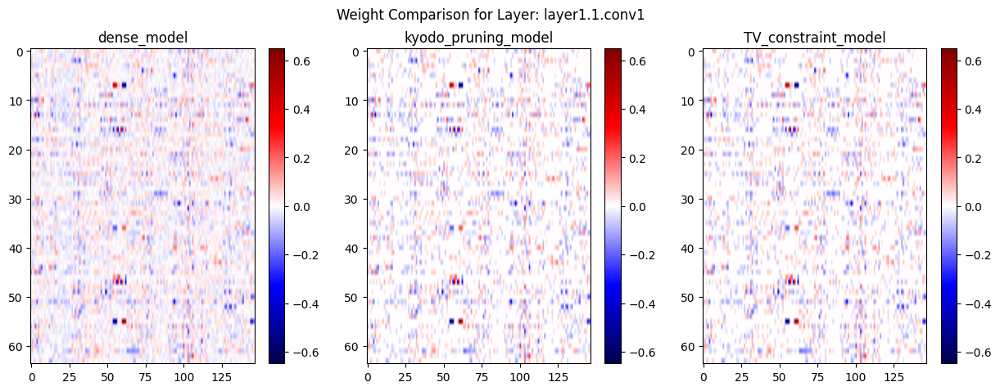

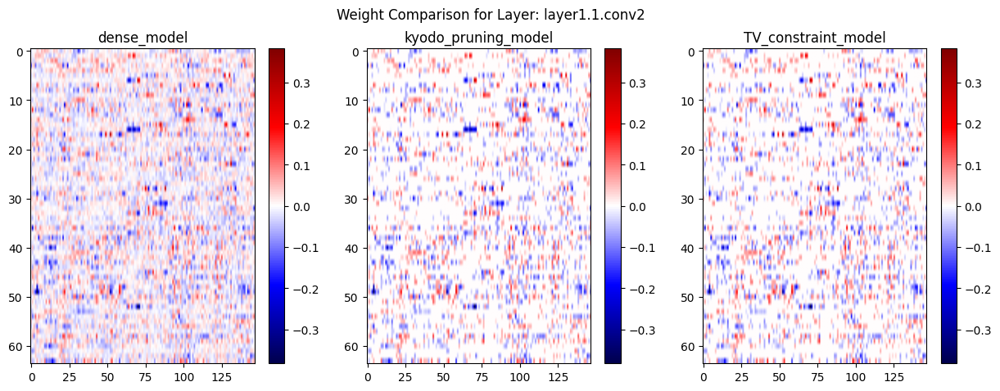

...

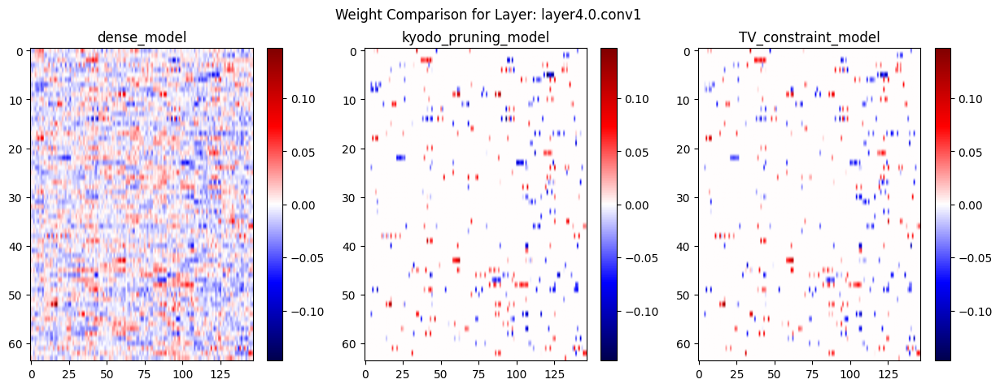

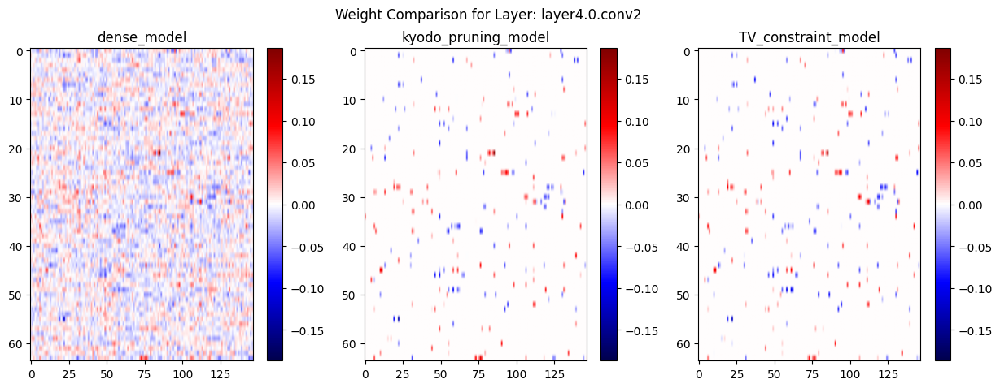

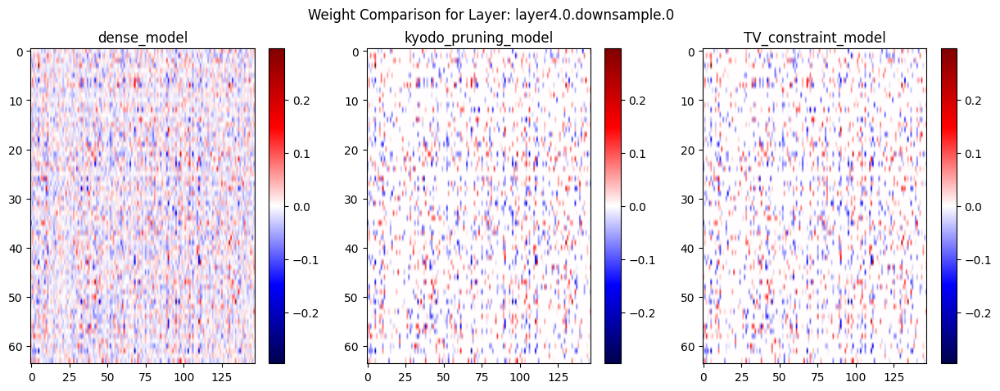

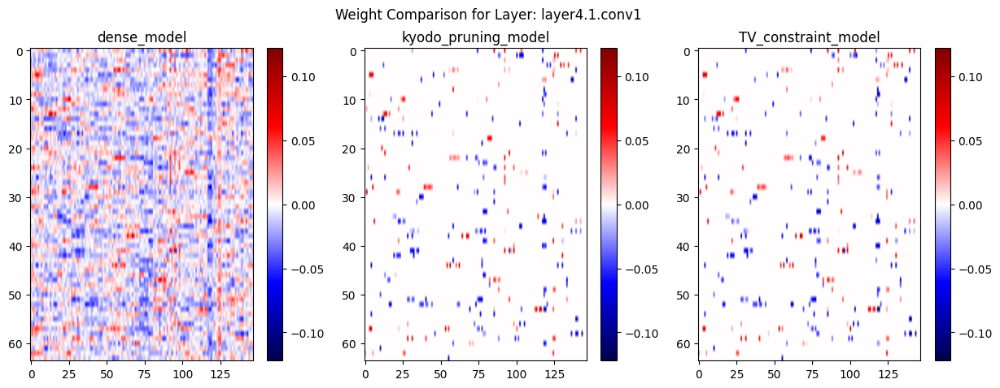

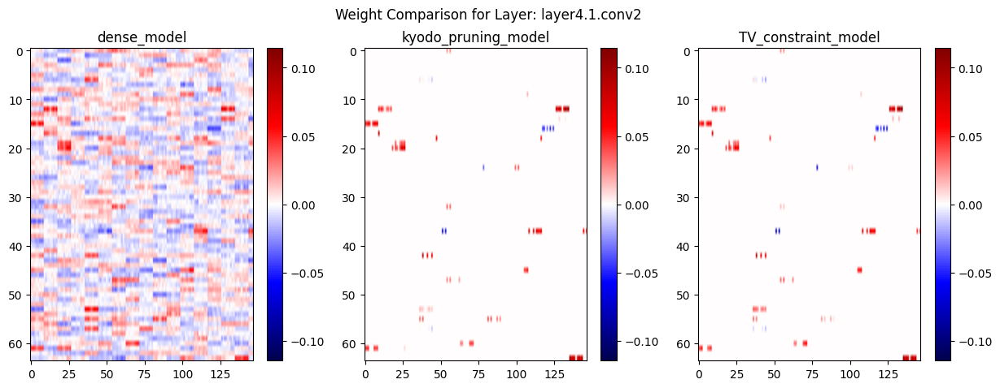

In [3]:
# 1. zipを使って2つのモデルのモジュールを同時にループ
for (name1, module1), (name2, module2), (name3, module3) in zip(dense_model.named_modules(), kyodo_pruning_model.named_modules(), model.named_modules()):

    # 2. 両方のモジュールが畳み込み層(nn.Conv2d)か判定
    if isinstance(module1, nn.Conv2d) and isinstance(module2, nn.Conv2d) and isinstance(module3, nn.Conv2d):
        
        # グラフを2つ横に並べて表示する準備
        fig, axes = plt.subplots(1, 3, figsize=(15, 5)) # (1行, 2列)
        
        # --- 左側のグラフ (model1) ---
        w1_2d = module1.weight.data.view(module1.weight.size(0), -1).numpy()[:64, :147]
        
        # --- 真ん中のグラフ (model2) ---
        w2_2d = module2.weight.data.view(module2.weight.size(0), -1).numpy()[:64, :147]

        # --- 右側のグラフ (model3) ---
        w3_2d = module3.weight.data.view(module3.weight.size(0), -1).numpy()[:64, :147]        
        
        # 3. カラーマップの範囲を両モデルで揃える（重要！）
        # これにより、色の濃淡を公平に比較できる
        vmax = max(np.abs(w1_2d).max(), np.abs(w2_2d).max(), np.abs(w3_2d).max())
        
        # model1の重みをプロット
        im1 = axes[0].imshow(w1_2d, cmap='seismic', aspect='auto', vmin=-vmax, vmax=vmax)
        axes[0].set_title("dense_model")
        
        # model2の重みをプロット
        im2 = axes[1].imshow(w2_2d, cmap='seismic', aspect='auto', vmin=-vmax, vmax=vmax)
        axes[1].set_title("kyodo_pruning_model")

        # model3の重みをプロット
        im3 = axes[2].imshow(w3_2d, cmap='seismic', aspect='auto', vmin=-vmax, vmax=vmax)
        axes[2].set_title("TV_constraint_model")

        # カラーバーを追加
        fig.colorbar(im1, ax=axes[0])
        fig.colorbar(im2, ax=axes[1])
        fig.colorbar(im3, ax=axes[2])
        
        # グラフ全体にタイトルを付ける
        fig.suptitle(f'Weight Comparison for Layer: {name1}')
        
        plt.show()
